In [7]:
import pandas as pd
import os
import numpy as np
from geopy.distance import distance as geo_distance

## Joe Futrelle get nearest stations
def get_cruise_stations(cruise):
    url = 'https://nes-lter-data.whoi.edu/api/stations/{}.csv'.format(cruise)
    return pd.read_csv(url)

class StationLocator(object):
    def __init__(self, cruise):
        self.station_metadata = get_cruise_stations(cruise.lower())

    def station_distances(self, lat, lon):
        distances = []
        index = []
        for station in self.station_metadata.itertuples():
            index.append(station.Index)
            distance = geo_distance([lat,lon], [station.latitude, station.longitude]).km
            distances.append(distance)
        distances = pd.Series(distances, index=index)
        return distances

    def nearest_station(self, lat, lon):
        distances = self.station_distances(lat, lon)
        i = distances.idxmin()
        distance = distances.loc[i]
        station_name = self.station_metadata['name'][i]
        return station_name, distance
    
    def nearest_stations(self, df, lat_col='latitude', lon_col='longitude'):
        names, distances, index = [], [], []
        for row in df.itertuples():
            lat = getattr(row, lat_col)
            lon = getattr(row, lon_col)
            name, distance = self.nearest_station(lat, lon)
            names.append(name)
            distances.append(distance)
        # df = df.copy()
        # df['nearest_station'] = names
        # df['station_distance'] = distances
        return names, distances

# Set working directory and data type
workdir = '/home/anhph/whoi/nes-lter/'
data_type = 'count'

# Load data
class_table = pd.read_csv(f'{workdir}/ifcb_class_table.csv')
meta_data = pd.read_csv(f'{workdir}/ifcb_meta_data.csv')
class_count = pd.read_csv(f'{workdir}/ifcb_class_{data_type}.csv')

# Convert sample_time to datetime and assign season
meta_data['sample_time'] = pd.to_datetime(meta_data['sample_time'])
meta_data['season'] = meta_data['sample_time'].dt.month.map(
    lambda x: 'JFM' if x in [1, 2, 3] else
              'AMJ' if x in [4, 5, 6] else
              'JAS' if x in [7, 8, 9] else
              'OND'
)

# Identify IFCB class count columns
data_cols = class_count.columns[1:].to_list()

# Merge metadata and class count data
df = pd.merge(meta_data, class_count[['pid'] + data_cols], on='pid', how='left')

# === CONFIGURABLE SAMPLE TYPES ===
# Define which sample types to include
selected_sample_types = ['cast']  # <-- Modify as needed

# Filter selected sample types
cruise_data = df[df['sample_type'].isin(selected_sample_types)].reset_index(drop=True)

# Split cast and non-cast samples
cast_data = cruise_data[cruise_data['sample_type'] == 'cast']
other_data = cruise_data[cruise_data['sample_type'] != 'cast']

# Define aggregation dictionary for cast data
agg_dict = {
    col: ('sum' if col in data_cols or col == 'ml_analyzed' else 'first') 
    for col in cast_data.columns 
    if col not in ['cruise', 'cast', 'depth']
}

# Group and aggregate 'cast' data
cast_agg = (
    cast_data
    .groupby(['cruise', 'cast', 'depth'], as_index=False)
    .agg(agg_dict)
)

# --- Enrich Cast Data with Bottle Data ---
# Initialize list to collect updated cast data
dfs = []

for CRUISE in cast_agg['cruise'].unique():
    try:
        # Load bottle data for this cruise
        btl = pd.read_csv(f'https://nes-lter-data.whoi.edu/api/ctd/{CRUISE}/bottles.csv')
        btl['cast'] = pd.to_numeric(btl['cast'], errors='coerce')
        btl['salinity_max'] = btl.groupby('cast')['sal00'].transform('max')

        # Subset cast data for current cruise
        ifcb = cast_agg[cast_agg['cruise'] == CRUISE].copy()

        # Ensure cast columns are numeric for both dataframes
        ifcb['cast'] = pd.to_numeric(ifcb['cast'], errors='coerce')
        btl['cast'] = pd.to_numeric(btl['cast'], errors='coerce')

        # Merge IFCB cast data with bottle data
        merge_keys = ['cruise', 'cast']
        if 'niskin' in ifcb.columns and 'niskin' in btl.columns:
            merge_keys.append('niskin')

        ds = pd.merge(ifcb, btl, on=merge_keys, how='left', suffixes=('', '_btl'))

        # Compute station info (requires StationLocator implementation)
        locator = StationLocator(CRUISE)
        ds['nearest_station'], ds['station_distance'] = locator.nearest_stations(ds)

        dfs.append(ds)
    except Exception as e:
        print(f"Warning: Failed processing cruise {CRUISE}: {e}")

# Replace cast_agg with the enriched version
cast_agg = pd.concat(dfs).reset_index(drop=True)

# --- Combine all data
# Combine aggregated cast data with unaggregated other sample types
df = pd.concat([cast_agg, other_data], ignore_index=True)

# Sort final DataFrame by sample_time
df = df.sort_values(by='sample_time').reset_index(drop=True)


In [8]:
import pandas as pd

# --- Load Data ---
# df = pd.read_csv('ifcb_count_20250128_underway_cast.csv')
class_table = pd.read_csv('ifcb_class_table.csv')
station_list = pd.read_csv('NESLTER_station_list.csv')['station']
taxonomy = pd.read_csv('IFCB_taxon.csv')

# --- Time Columns ---
df['sample_time'] = pd.to_datetime(df['sample_time'])
df['year'] = df['sample_time'].dt.year
df['month'] = df['sample_time'].dt.month
df['day'] = df['sample_time'].dt.day

# --- Filter to Stations of Interest ---
metadata = df#[df['nearest_station'].isin(station_list)].reset_index(drop=True)

# --- Taxonomic Column Handling ---
raw_annotations = taxonomy['Annotations'].tolist()
valid_annotations = [col for col in raw_annotations if col in metadata.columns]
column_collapse = dict(zip(taxonomy['Annotations'], taxonomy['Label']))

# --- Normalize & Collapse into Taxonomic Data ---
normalized = (
    metadata[valid_annotations] # Select only valid taxonomic columns
    .div(metadata['ml_analyzed'], axis=0) # Normalize by ml_analyzed
    .mul(5) # Scale to 5 ml
    .rename(columns=column_collapse) # Rename columns based on taxonomy
    .groupby(level=0, axis=1) # Group by taxonomic level
    .sum() # Sum across taxonomic levels
    .round(0) # Round to nearest integer
    .astype(int) # Convert to integer type
)

# Drop unwanted taxa if present
cols_to_drop = ['unknown Cyanobacteria']
normalized = normalized.drop(columns=[col for col in cols_to_drop if col in normalized.columns])

# Remove raw taxonomic annotation columns from metadata
metadata = metadata.drop(columns=[col for col in raw_annotations if col in metadata.columns])

# Merge processed taxa back into metadata
metadata = pd.concat([metadata, normalized], axis=1)

# --- Final Dataset Extraction ---
data_cols = sorted(normalized.columns)  # Taxonomic features only
dataset = metadata[data_cols]

# --- Collapse Genus to Phylum ---
# Create genus → phylum mapping
genus_to_phylum = dict(zip(taxonomy['Label'], taxonomy['Phylum']))

# Filter only taxa columns from dataset (should already match data_cols)
# Drop taxa with unknown phylum mapping (if any)
valid_taxa = [col for col in dataset.columns if col in genus_to_phylum and pd.notna(genus_to_phylum[col])]
mapped_phyla = [genus_to_phylum[col] for col in valid_taxa]

# Group dataset by phylum
phylum_counts = dataset[valid_taxa].groupby(by=lambda x: genus_to_phylum[x], axis=1).sum()

# Merge into clean metadata
metadata_phylum = metadata.drop(columns=data_cols)  # Remove genus-level taxa
metadata_phylum = pd.concat([metadata_phylum, phylum_counts], axis=1)

# Optional: store phylum-level data separately
data_cols_phylum = list(phylum_counts.columns)
dataset_phylum = metadata_phylum[data_cols_phylum]

# --- Save Results ---
metadata.to_csv('ifcb_neslter_count_genus.csv', index=False)
metadata_phylum.to_csv('ifcb_neslter_count_phylum.csv', index=False)


/tmp/ipykernel_25439/186556155.py:25: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  metadata[valid_annotations] # Select only valid taxonomic columns
/tmp/ipykernel_25439/186556155.py:59: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  phylum_counts = dataset[valid_taxa].groupby(by=lambda x: genus_to_phylum[x], axis=1).sum()


In [9]:
# Define custom sort orders
station_order = ['MVCO'] + [f'L{i}' for i in range(1, 12)]
season_order = ['JFM', 'AMJ', 'JAS', 'OND']

# Filter df to include only desired stations
df_filtered = df[df['nearest_station'].isin(station_order)]

# Create pivot table
pivot_df = (
    df_filtered
    .groupby(['season', 'year', 'nearest_station'])
    .size()
    .reset_index(name='count')
    .pivot_table(index=['season', 'year'], columns='nearest_station', values='count')
)

# Reindex columns and rows
pivot_df = pivot_df.reindex(columns=station_order)

# Reorder season index
pivot_df = pivot_df.reset_index()
pivot_df['season'] = pd.Categorical(pivot_df['season'], categories=season_order, ordered=True)
pivot_df = pivot_df.sort_values(['season', 'year'])

# Optionally fill NaN with 0
# pivot_df = pivot_df.fillna(0).astype(int)

# Set index again if needed
pivot_df = pivot_df.set_index(['season', 'year'])
pivot_df


nearest_station  MVCO   L1   L2   L3    L4    L5    L6    L7    L8    L9  \
season year                                                                
JFM    2018       1.0  3.0  3.0  1.0   3.0   3.0   2.0   3.0   3.0   2.0   
       2019       2.0  3.0  3.0  2.0   3.0   3.0   3.0   3.0   3.0   3.0   
       2020       3.0  2.0  2.0  4.0   4.0   6.0   4.0   3.0   3.0   5.0   
       2021       3.0  4.0  6.0  5.0   2.0   5.0   NaN   NaN   NaN   NaN   
       2022       2.0  3.0  6.0  5.0   8.0   1.0   5.0   6.0   2.0   1.0   
       2023       2.0  6.0  3.0  2.0   4.0   2.0   3.0   2.0   3.0   2.0   
       2024       2.0  3.0  4.0  4.0   6.0   2.0   2.0   1.0   6.0   2.0   
       2025       2.0  3.0  4.0  4.0   5.0   4.0   6.0   6.0   4.0   7.0   
AMJ    2018       NaN  2.0  1.0  3.0   1.0   2.0   4.0   4.0   3.0   5.0   
       2019       NaN  2.0  2.0  3.0   4.0   4.0   3.0   3.0   2.0   3.0   
       2020       NaN  NaN  1.0  NaN   NaN   NaN   NaN   NaN   NaN   NaN   
       2022       NaN  1.0  5.0  4.0   4.0   5.0   8.0  10.0   6.0  12.0   
       2024       3.0  3.0  5.0  5.0   4.0   4.0   4.0   5.0   6.0   4.0   
JAS    2017       2.0  NaN  NaN  NaN   NaN   NaN   6.0   NaN   2.0   NaN   
       2018       2.0  3.0  3.0  3.0   2.0   3.0   3.0   3.0   2.0   3.0   
       2019       3.0  3.0  5.0  8.0  10.0   4.0   4.0   4.0   1.0   9.0   
       2020       NaN  4.0  5.0  6.0   5.0   7.0   5.0   5.0   NaN   4.0   
       2021       3.0  3.0  4.0  4.0   3.0   5.0   8.0   5.0   8.0   4.0   
       2022       3.0  4.0  7.0  5.0   6.0   5.0   6.0   6.0   4.0   5.0   
       2023       2.0  3.0  7.0  2.0   2.0   2.0   6.0   3.0   3.0   3.0   
       2024       3.0  3.0  3.0  6.0   4.0   6.0   2.0   7.0   6.0   8.0   
OND    2017       4.0  NaN  NaN  NaN   NaN   NaN   8.0   4.0  11.0   2.0   
       2018       NaN  2.0  2.0  2.0   2.0   2.0   2.0   NaN   NaN   NaN   
       2019       NaN  2.0  2.0  1.0   2.0   1.0   2.0   2.0   2.0   2.0   
       2020       3.0  3.0  4.0  2.0   5.0   2.0   4.0   2.0   6.0   2.0   
       2021       NaN  3.0  4.0  3.0   3.0   6.0  10.0   7.0   4.0   6.0   
       2022       NaN  NaN  2.0  NaN   2.0   1.0   1.0   2.0   2.0   2.0   
       2023       2.0  2.0  1.0  4.0   4.0  10.0   5.0   5.0   4.0   4.0   

nearest_station   L10   L11  
season year                  
JFM    2018       2.0   2.0  
       2019       4.0   6.0  
       2020       6.0   4.0  
       2021       4.0   7.0  
       2022       4.0   2.0  
       2023       3.0   2.0  
       2024       3.0   6.0  
       2025       8.0   4.0  
AMJ    2018       3.0   3.0  
       2019       5.0   7.0  
       2020       NaN   NaN  
       2022      11.0  10.0  
       2024       3.0   5.0  
JAS    2017       2.0   NaN  
       2018       2.0   2.0  
       2019       5.0   7.0  
       2020       7.0   NaN  
       2021       6.0   7.0  
       2022       8.0   4.0  
       2023       2.0   1.0  
       2024       4.0   8.0  
OND    2017       8.0   NaN  
       2018       NaN   NaN  
       2019       NaN   2.0  
       2020       8.0   8.0  
       2021       8.0   4.0  
       2022       2.0   2.0  
       2023       3.0   8.0

# Hierarchical clustering

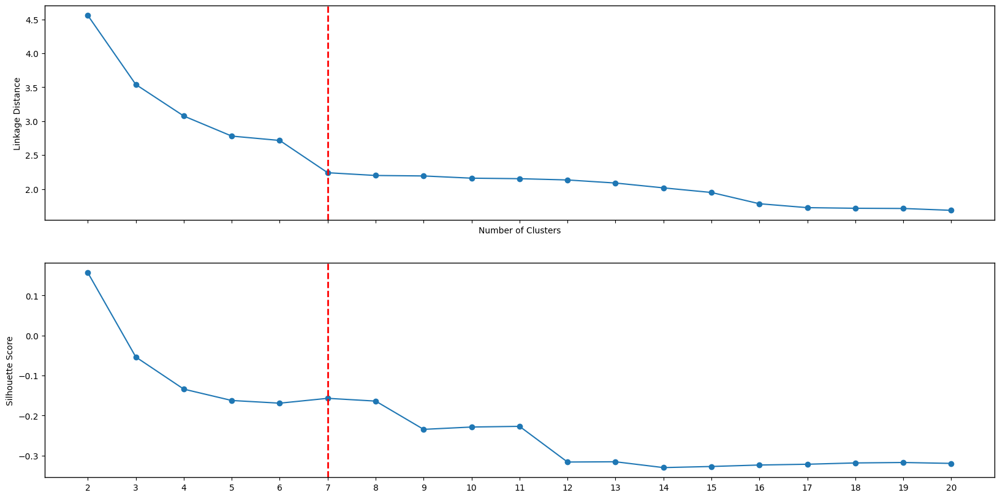

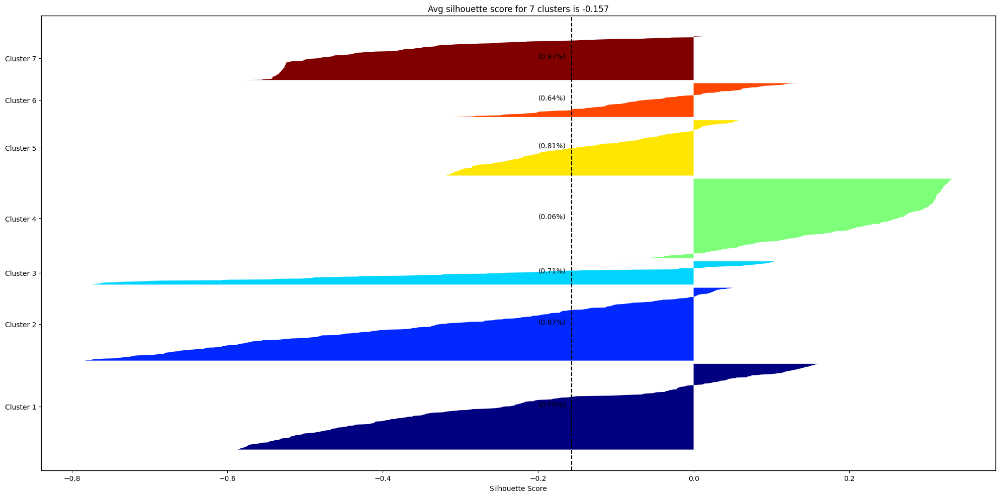

/tmp/ipykernel_25439/2495337097.py:135: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax1.set_xlabel(f"PC1 ({round(pca_summary['Proportion of variance'][0] * 100, 1)}%)", fontsize=16)
/tmp/ipykernel_25439/2495337097.py:136: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax1.set_ylabel(f"PC2 ({round(pca_summary['Proportion of variance'][1] * 100, 1)}%)", fontsize=16)
/tmp/ipykernel_25439/2495337097.py:146: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use 

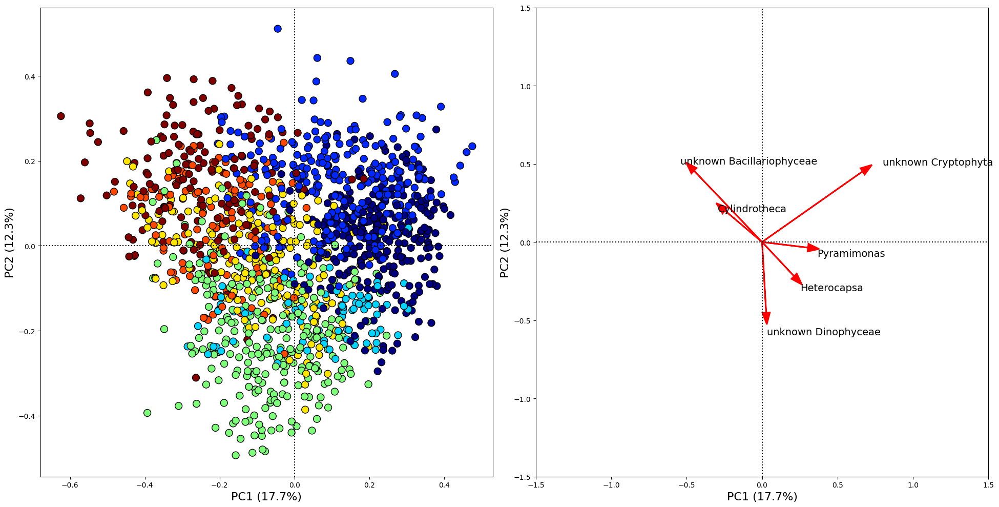

Top 10 variables correlated with PC1:
unknown Cryptophyta    0.666143
Pyramimonas            0.304487
Heterocapsa            0.212099
Acanthoica             0.110440
Thalassiosira          0.051429
unknown Flagellates    0.045886
Apedinella             0.037188
Dictyocha              0.029233
unknown Dinophyceae    0.027038
Tripos                 0.020233
Name: PC1, dtype: float64

Top 10 variables correlated with PC2:
unknown Bacillariophyceae    0.455474
unknown Cryptophyta          0.451289
Cylindrotheca                0.201110
Guinardia                    0.089227
Rhizosolenia                 0.084442
Thalassionema                0.084067
Skeletonema                  0.076019
Thalassiosira                0.067477
Pleurosigma                  0.045278
Asterionellopsis             0.043755
Name: PC2, dtype: float64

Top 10 variables correlated with PC3:
Heterocapsa                  0.576129
unknown Bacillariophyceae    0.244673
Cylindrotheca                0.121232
Nanoneis          

/tmp/ipykernel_25439/2495337097.py:190: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = metadata.groupby('year_season')[data_cols].sum().reindex(full_labels)


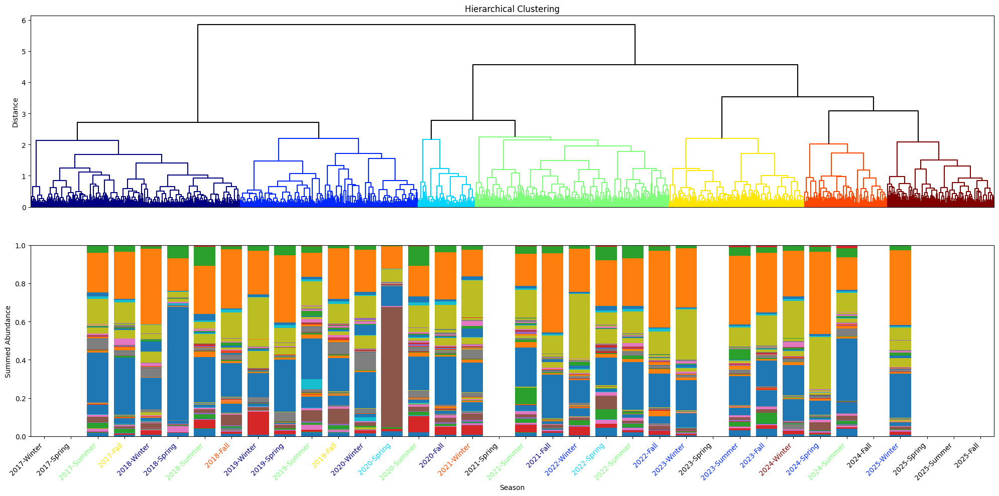

In [11]:
# --- Imports ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from matplotlib.colors import ListedColormap
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster, set_link_color_palette
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.decomposition import PCA
import colorsys, random

# --- Set Random Seed for Reproducibility ---
random.seed(10)

# --- Custom Functions ---

def hellinger_distance(p, q):
    """Compute Hellinger distance between two vectors."""
    p, q = np.asarray(p), np.asarray(q)
    if p.sum() == 0 or q.sum() == 0:
        return np.nan
    p, q = p / p.sum(), q / q.sum()
    return np.sqrt(np.sum((np.sqrt(p) - np.sqrt(q))**2)) / np.sqrt(2)

def hellinger_transform(X):
    """Apply Hellinger transform to compositional data."""
    return np.sqrt(X / X.sum(axis=1, keepdims=True))

def generate_hex_colors(n, colormap_name='viridis'):
    """Generate n distinct hex colors from a matplotlib colormap."""
    cmap = plt.get_cmap(colormap_name)
    return [mcolors.to_hex(cmap(i / (n - 1))) for i in range(n)]

def get_season_label(date):
    """Assign seasonal label based on a datetime object."""
    month = date.month
    if month in [1, 2, 3]: return f"{date.year}-Winter"
    elif month in [4, 5, 6]: return f"{date.year}-Spring"
    elif month in [7, 8, 9]: return f"{date.year}-Summer"
    else: return f"{date.year}-Fall"

# --- Data Setup ---
ds = metadata.copy()
X = np.asarray(dataset)
data_cols = list(dataset.columns)


# --- Hierarchical Clustering ---
n_clusters = 7
Z = linkage(pdist(X, metric=hellinger_distance), method='ward')
ds['cluster'] = fcluster(Z, t=n_clusters, criterion='maxclust')
threshold = Z[-(n_clusters - 1), 2]
colors = generate_hex_colors(n_clusters, colormap_name="jet")
set_link_color_palette(colors)

# --- Dendrogram + Silhouette Score for K Optimization ---
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(20, 10), sharex=True)
kmax = 20

# Linkage distances plot
linkage_distances = [Z[-i, 2] for i in range(2, kmax + 1)]
ax1.plot(range(2, kmax + 1), linkage_distances, marker='o')
ax1.axvline(x=n_clusters, c='red', lw=2, linestyle='--')
ax1.set_xlabel('Number of Clusters')
ax1.set_ylabel('Linkage Distance')
ax1.set_xticks(np.arange(2, kmax + 1, 1))
ax1.spines[:].set_linewidth(1)
ax1.spines[:].set_color('k')

# Silhouette score plot
silhouette_scores = [
    silhouette_score(X, fcluster(Z, t=k, criterion='maxclust')) for k in range(2, kmax + 1)
]
ax2.plot(range(2, kmax + 1), silhouette_scores, marker='o')
ax2.axvline(x=n_clusters, c='red', lw=2, linestyle='--')
ax2.set_ylabel('Silhouette Score')
ax2.spines[:].set_linewidth(1)
ax2.spines[:].set_color('k')
plt.show()

# --- Silhouette Analysis by Cluster ---
fig, ax = plt.subplots(figsize=(20, 10))
cluster_labels = ds['cluster'].values
sample_silhouette_vals = silhouette_samples(X, cluster_labels)
silhouette_avg = np.round(silhouette_score(X, cluster_labels), 4)

y_lower = 10
yticks = []
for i in range(1, n_clusters + 1):
    values = sample_silhouette_vals[cluster_labels == i]
    values.sort()
    size = len(values)
    missclass = np.sum(values < 0) / size
    y_upper = y_lower + size

    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, values, facecolor=colors[i - 1])
    ytick = y_lower + 0.5 * size
    ax.text(-0.2, ytick, f'({np.round(missclass, 2)}%)')
    yticks.append((f'Cluster {i}', ytick))
    y_lower = y_upper + 10

ax.set_title(f"Avg silhouette score for {n_clusters} clusters is {silhouette_avg}")
ax.set_xlabel("Silhouette Score")
ax.axvline(x=silhouette_avg, color="black", linestyle="--")
ax.set_yticks([y for _, y in yticks])
ax.set_yticklabels([label for label, _ in yticks])
ax.spines[:].set_linewidth(1)
ax.spines[:].set_color('k')
plt.tight_layout()
plt.show()

# --- PCA Analysis ---
X_transformed = hellinger_transform(X)
pca = PCA().fit(X_transformed)
scores = pca.transform(X_transformed)
pca_summary = pd.DataFrame({
    'Standard deviation': np.sqrt(pca.explained_variance_),
    'Proportion of variance': pca.explained_variance_ratio_,
    'Cumulative proportion': np.cumsum(pca.explained_variance_ratio_)
}, index=[f'PC{i+1}' for i in range(pca.n_components_)])

# PCA loadings
corr = pca.components_.T
pcs = list(pca_summary.index)
mask = (np.abs(corr[:, 0]) >= 0.2) | (np.abs(corr[:, 1]) >= 0.2)

# PCA Plot
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(20, 10))
ax1.axhline(0, linestyle="dotted", color="black")
ax1.axvline(0, linestyle="dotted", color="black")
ax1.scatter(scores[:, 0], scores[:, 1], c=ds['cluster'], s=100, edgecolor='k', cmap=ListedColormap(colors))
ax1.set_xlabel(f"PC1 ({round(pca_summary['Proportion of variance'][0] * 100, 1)}%)", fontsize=16)
ax1.set_ylabel(f"PC2 ({round(pca_summary['Proportion of variance'][1] * 100, 1)}%)", fontsize=16)

# Feature (loadings) plot
ax2.axhline(0, linestyle="dotted", color="black")
ax2.axvline(0, linestyle="dotted", color="black")
for x, y, label in zip(corr[mask, 0], corr[mask, 1], np.array(data_cols)[mask]):
    ax2.arrow(0, 0, x, y, head_width=0.05, color="red", lw=2)
    ax2.text(x*1.2, y*1.2, label, fontsize=14, color="black", va='top', ha='left')
ax2.set_xlim(-1.5, 1.5)
ax2.set_ylim(-1.5, 1.5)
ax2.set_xlabel(f"PC1 ({round(pca_summary['Proportion of variance'][0] * 100, 1)}%)", fontsize=16)
ax2.set_ylabel(f"PC2 ({round(pca_summary['Proportion of variance'][1] * 100, 1)}%)", fontsize=16)
plt.tight_layout()
plt.show()

# --- Top Loadings per PC ---
corr_df = pd.DataFrame(corr, index=data_cols, columns=pcs)
top_correlations = {
    pc: corr_df[pc].sort_values(ascending=False).head(10)
    for pc in pcs[:3]
}

for pc, values in top_correlations.items():
    print(f"Top 10 variables correlated with {pc}:\n{values}\n")

# --- Season Binning ---
ds['sample_time'] = pd.to_datetime(ds['sample_time'])
ds['year_season'] = pd.Categorical(ds['sample_time'].apply(get_season_label))

start_year = ds['sample_time'].min().year
end_year = ds['sample_time'].max().year
seasons = ['Winter', 'Spring', 'Summer', 'Fall']
full_labels = [f"{year}-{season}" for year in range(start_year, end_year + 1) for season in seasons]

ds['year_season'] = pd.Categorical(ds['year_season'], categories=full_labels, ordered=True)
season_to_index = {label: i for i, label in enumerate(full_labels)}
ds['x_pos'] = ds['year_season'].map(season_to_index)

# --- Dendrogram + Seasonal Abundance ---
fig = plt.figure(figsize=(20, 10))
gs = fig.add_gridspec(2, 1)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

# Dendrogram
dendrogram(Z, ax=ax1, no_labels=True, color_threshold=threshold, above_threshold_color='k')
ax1.set_title("Hierarchical Clustering")
ax1.set_ylabel("Distance")

# Re-process metadata for abundance plot
metadata['sample_time'] = pd.to_datetime(metadata['sample_time'])
metadata['year_season'] = metadata['sample_time'].apply(get_season_label)
metadata['year_season'] = pd.Categorical(metadata['year_season'], categories=full_labels, ordered=True)

grouped = metadata.groupby('year_season')[data_cols].sum().reindex(full_labels)
grouped = grouped.div(grouped.sum(axis=1), axis=0).fillna(0)

# Stacked bar plot
bottom = np.zeros(len(grouped))
for col in data_cols:
    ax2.bar(grouped.index, grouped[col], bottom=bottom, label=col)
    bottom += grouped[col].values

# Tick coloring by dominant cluster
dominant_colors = {}
for season in full_labels:
    clusters = ds.loc[ds['year_season'] == season, 'cluster']
    if not clusters.empty:
        dominant = clusters.value_counts().idxmax()
        dominant_colors[season] = dict(zip(range(1, n_clusters + 1), colors))[dominant]

ax2.set_ylabel('Summed Abundance')
ax2.set_xlabel('Season')
ax2.set_xticks(range(len(full_labels)))
ax2.set_xticklabels(full_labels, rotation=45, ha='right')
ax2.set_xlim(-0.5, len(full_labels) - 0.5)
for tick_label in ax2.get_xticklabels():
    label = tick_label.get_text()
    tick_label.set_color(dominant_colors.get(label, 'black'))

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
plt.show()


# K-means clustering

/tmp/ipykernel_25439/1824712876.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax1.set_xlabel(f"PC1 ({round(pca_summary['Proportion of variance'][0] * 100, 1)}%)", fontsize=16)
/tmp/ipykernel_25439/1824712876.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax1.set_ylabel(f"PC{pc2} ({round(pca_summary['Proportion of variance'][pc2 - 1] * 100, 1)}%)", fontsize=16)
/tmp/ipykernel_25439/1824712876.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positio

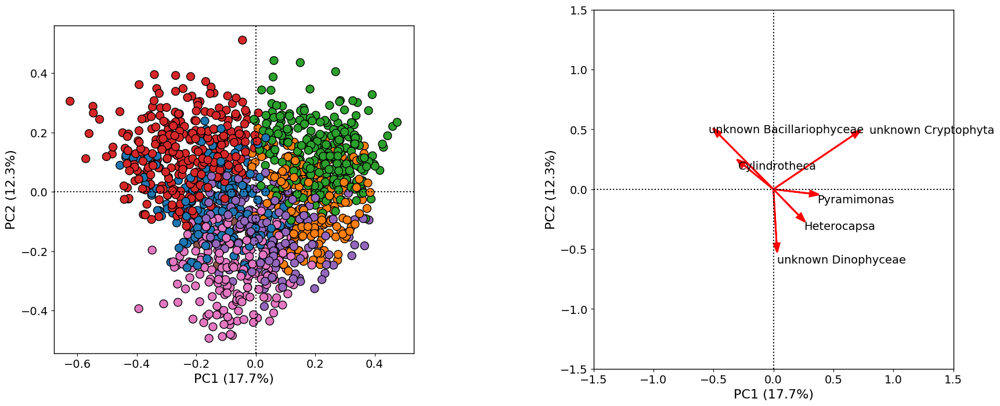

Top 10 variables correlated with PC1:
unknown Cryptophyta    0.666143
Pyramimonas            0.304487
Heterocapsa            0.212099
Acanthoica             0.110440
Thalassiosira          0.051429
unknown Flagellates    0.045886
Apedinella             0.037188
Dictyocha              0.029233
unknown Dinophyceae    0.027038
Tripos                 0.020233
Name: PC1, dtype: float64 

Top 10 variables correlated with PC2:
unknown Bacillariophyceae    0.455474
unknown Cryptophyta          0.451289
Cylindrotheca                0.201110
Guinardia                    0.089227
Rhizosolenia                 0.084442
Thalassionema                0.084067
Skeletonema                  0.076019
Thalassiosira                0.067477
Pleurosigma                  0.045278
Asterionellopsis             0.043755
Name: PC2, dtype: float64 

Top 10 variables correlated with PC3:
Heterocapsa                  0.576129
unknown Bacillariophyceae    0.244673
Cylindrotheca                0.121232
Nanoneis        

In [12]:
from sklearn.cluster import KMeans

# Parameters
n_clusters = 7  # Set the desired number of clusters
random_state = 42  # For reproducibility

# Transform data with Hellinger if needed
X_transformed = hellinger_transform(X)

# PCA
model = PCA().fit(X_transformed)
scores = model.transform(X_transformed)
corr = model.components_.T
pcs = [f'PC{i+1}' for i in range(corr.shape[1])]
var_list = list(dataset.columns)
pca_summary = pd.DataFrame({
    'Standard deviation': np.sqrt(model.explained_variance_),
    'Proportion of variance': model.explained_variance_ratio_,
    'Cumulative proportion': np.cumsum(model.explained_variance_ratio_)
}, index=pcs)

# Fit KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
clusters = kmeans.fit_predict(X_transformed)

# Add cluster assignments to your dataset
ds['cluster'] = clusters

# Generate color list
colors = [plt.cm.tab10(i) for i in range(n_clusters)]

# Mask for variable vectors
mask = (np.abs(corr[:, 0]) >= 0.2) | (np.abs(corr[:, 1]) >= 0.2)

# Plot PCA with clusters
pc2 = 2  # Change this to plot different PCs
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(20, 10))
ax1.axhline(0, linestyle="dotted", color="black")
ax1.axvline(0, linestyle="dotted", color="black")
ax1.scatter(scores[:, 0], scores[:, pc2 - 1], c=clusters, s=100, edgecolor='k', alpha=1, cmap=ListedColormap(colors))
ax1.set_xlabel(f"PC1 ({round(pca_summary['Proportion of variance'][0] * 100, 1)}%)", fontsize=16)
ax1.set_ylabel(f"PC{pc2} ({round(pca_summary['Proportion of variance'][pc2 - 1] * 100, 1)}%)", fontsize=16)
ax1.tick_params(labelsize=14)

# Feature (loading) plot
ax2.axhline(0, linestyle="dotted", color="black")
ax2.axvline(0, linestyle="dotted", color="black")
for x, y, label in zip(corr[mask, 0], corr[mask, pc2 - 1], np.array(var_list)[mask]):
    ax2.arrow(0, 0, x, y, head_width=0.05, color="red", lw=2)
    ax2.text(x * 1.2, y * 1.2, label, fontsize=14, color="black", va='top', ha='left')

ax2.set_xlim(-1.5, 1.5)
ax2.set_ylim(-1.5, 1.5)
ax2.set_xlabel(f"PC1 ({round(pca_summary['Proportion of variance'][0] * 100, 1)}%)", fontsize=16)
ax2.set_ylabel(f"PC{pc2} ({round(pca_summary['Proportion of variance'][pc2 - 1] * 100, 1)}%)", fontsize=16)
ax2.tick_params(labelsize=14)

fig.subplots_adjust(wspace=0.5)
ax1.set_aspect('equal')
ax2.set_aspect('equal')
ax1.grid(False)
ax2.grid(False)
ax1.spines[:].set_linewidth(1)
ax1.spines[:].set_color('k')
ax2.spines[:].set_linewidth(1)
ax2.spines[:].set_color('k')
plt.show()

# Top correlated variables per PC
corr_df = pd.DataFrame(corr, index=var_list, columns=pcs)
corr_df.sort_values(by='PC1', ascending=False, inplace=True)

top_correlations = {}
for pc in pcs[:3]:
    sorted_taxa = corr_df[pc].sort_values(ascending=False).head(10)
    top_correlations[pc] = sorted_taxa

for pc, correlations in top_correlations.items():
    print(f"Top 10 variables correlated with {pc}:")
    print(correlations, "\n")

# # Latitude-Depth plot per cruise
# stations = pd.read_csv('NESLTER_station_list.csv')
# bathy = pd.read_csv('NESLTER_transect_bathymetry.csv')

# for cruise in ds['cruise'].unique():
#     cruise_data = ds[ds['cruise'] == cruise]
#     fig, ax = plt.subplots(figsize=(15, 5))
#     ax.scatter(cruise_data['latitude'], cruise_data['depth'],
#                c=cruise_data['cluster'], s=s, edgecolor='k', alpha=1,
#                cmap=ListedColormap(colors), label=cruise)
#     ax.set_xlabel('Latitude')
#     ax.set_ylabel('Depth')
#     ax.set_xlim(41.5, 39.5)
#     ax.set_ylim(150, 0)
#     ax.set_title(f'Cruise: {cruise}')

#     ax_top = ax.twiny()
#     ax_top.set_xlim(ax.get_xlim())
#     ax_top.set_xticks(stations['latitude'])
#     ax_top.set_xticklabels(stations['station'].astype(str), weight='bold', size=10)

#     ax.plot(bathy['latitude'], bathy['bottom_depth_meters'], 'k-', label='Bathymetry', linewidth=0.5)


# Topic Modeling

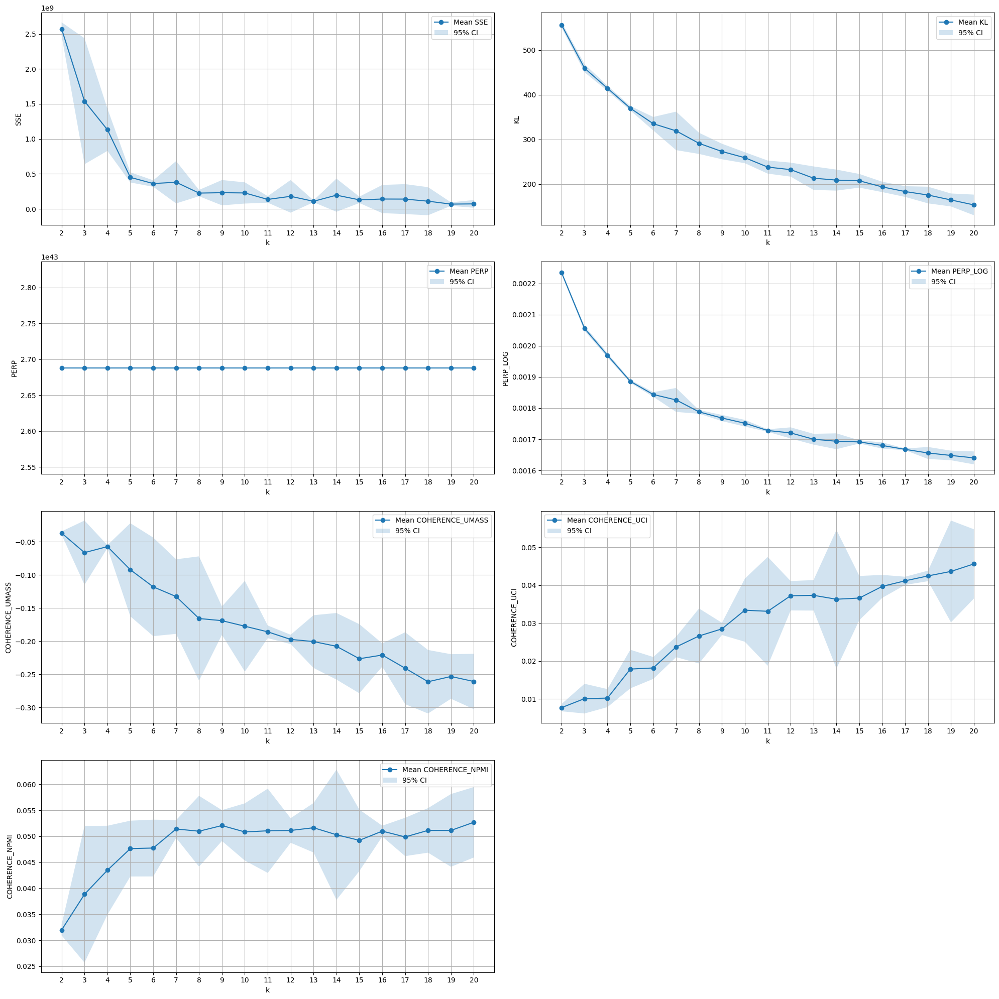

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import rostpy
from scipy.stats import sem
from scipy.stats import t as ttest
from collections import defaultdict
from itertools import combinations

# Set random seed for reproducibility
seed = 5
np.random.seed(seed)

# Load the dataset and metadata
taxa = dataset.columns
times = metadata['pid']



# === Define Metrics ===
def kl_divergence(p, q, epsilon=1e-10):
    p = np.asarray(p, dtype=np.float64)
    q = np.asarray(q, dtype=np.float64)
    p = p / p.sum(axis=1, keepdims=True)
    q = q / q.sum(axis=1, keepdims=True)
    p = np.clip(p, epsilon, 1)
    q = np.clip(q, epsilon, 1)
    return np.sum(p * np.log(p / q))

def perplexity(p, q, epsilon=1e-10):
    p = np.asarray(p, dtype=np.float64)
    q = np.asarray(q, dtype=np.float64)
    p = p / p.sum(axis=1, keepdims=True)
    q = q / q.sum(axis=1, keepdims=True)
    q = np.clip(q, epsilon, 1)
    cross_entropy = -np.sum(p * np.log(q))
    cross_entropy = np.clip(cross_entropy, -1e2, 1e2)
    return np.exp(cross_entropy)

def perplexity_log(doc_topic, word_topic, counts):
    eps = 1e-12
    pred_probs = doc_topic @ word_topic
    log_probs = np.log(pred_probs + eps)
    log_likelihood = np.sum(counts * log_probs)
    total_words = np.sum(counts)
    return np.exp(-log_likelihood / total_words)

def compute_coherence_umass(top_words, doc_word_matrix, vocab, epsilon=1e-12):
    word_to_index = {word: idx for idx, word in enumerate(vocab)}
    doc_word_binary = (doc_word_matrix > 0).astype(int)
    scores = []

    for topic_words in top_words:
        score = 0.0
        pairs = list(combinations(topic_words, 2))
        for w_i, w_j in pairs:
            idx_i = word_to_index[w_i]
            idx_j = word_to_index[w_j]
            D_wi_wj = np.sum((doc_word_binary[:, idx_i] & doc_word_binary[:, idx_j]))
            D_wj = np.sum(doc_word_binary[:, idx_j])
            score += np.log((D_wi_wj + epsilon) / (D_wj + epsilon))
        if len(pairs) > 0:
            score /= len(pairs)
        scores.append(score)
    return np.mean(scores)

def compute_coherence_uci(top_words, doc_word_matrix, vocab, epsilon=1e-12):
    word_to_index = {word: idx for idx, word in enumerate(vocab)}
    doc_word_binary = (doc_word_matrix > 0).astype(int)
    num_docs = doc_word_binary.shape[0]
    scores = []

    for topic_words in top_words:
        score = 0.0
        count = 0
        for w_i, w_j in combinations(topic_words, 2):
            idx_i = word_to_index[w_i]
            idx_j = word_to_index[w_j]
            D_wi = np.sum(doc_word_binary[:, idx_i])
            D_wj = np.sum(doc_word_binary[:, idx_j])
            D_wi_wj = np.sum(doc_word_binary[:, idx_i] & doc_word_binary[:, idx_j])
            p_wi = D_wi / num_docs
            p_wj = D_wj / num_docs
            p_wi_wj = D_wi_wj / num_docs
            pmi = np.log((p_wi_wj + epsilon) / (p_wi * p_wj + epsilon))
            score += pmi
            count += 1
        scores.append(score / count if count > 0 else 0)
    return np.mean(scores)

def compute_coherence_npmi(top_words, doc_word_matrix, vocab, epsilon=1e-12):
    word_to_index = {word: idx for idx, word in enumerate(vocab)}
    doc_word_binary = (doc_word_matrix > 0).astype(int)
    num_docs = doc_word_binary.shape[0]
    scores = []

    for topic_words in top_words:
        score = 0.0
        count = 0
        for w_i, w_j in combinations(topic_words, 2):
            idx_i = word_to_index[w_i]
            idx_j = word_to_index[w_j]
            D_wi = np.sum(doc_word_binary[:, idx_i])
            D_wj = np.sum(doc_word_binary[:, idx_j])
            D_wi_wj = np.sum(doc_word_binary[:, idx_i] & doc_word_binary[:, idx_j])
            p_wi = D_wi / num_docs
            p_wj = D_wj / num_docs
            p_wi_wj = D_wi_wj / num_docs
            if p_wi_wj > 0:
                pmi = np.log((p_wi_wj + epsilon) / (p_wi * p_wj + epsilon))
                npmi = pmi / (-np.log(p_wi_wj + epsilon))
                score += npmi
                count += 1
        scores.append(score / count if count > 0 else 0)
    return np.mean(scores)

def mean_ci(data, confidence=0.95):
    n = len(data)
    m = np.mean(data)
    se_ = sem(data)
    h = se_ * ttest.ppf((1 + confidence) / 2., n - 1)
    return m, m - h, m + h

# === Result containers ===
results_sse = defaultdict(list)
results_kl = defaultdict(list)
results_perp = defaultdict(list)
results_perp_log = defaultdict(list)
results_coherence_umass = defaultdict(list)
results_coherence_uci = defaultdict(list)
results_coherence_npmi = defaultdict(list)

# === Main loop ===
for seed in [5, 15, 25]:
    np.random.seed(seed)

    for i in range(2, 21):
        rost = rostpy.ROST_t(V=len(taxa), K=i, alpha=0.1, beta=0.1, gamma=0.1)

        for t, (_, data) in enumerate(dataset.iterrows()):
            obs = []
            for taxon, count in enumerate(data):
                obs.extend([taxon] * count)
            rost.add_observation([t], obs)

        for epoch in range(100):
            rostpy.parallel_refine(rost, 15)

        topics = {f"community_{j+1}": [0 for _ in times] for j in range(rost.K)}
        for t in range(len(times)):
            for topic in rost.get_topics_for_pose((t,)):
                topics[f"community_{topic+1}"][t] += 1
        topic_df = pd.DataFrame(topics, index=times)
        topic_prob_df = topic_df.div(topic_df.sum(axis=1), axis=0)

        word_topic_matrix = rost.get_topic_model()
        wt_matrix_df = pd.DataFrame(word_topic_matrix, columns=taxa,
                                    index=[f"community_{j+1}" for j in range(rost.K)])
        wt_matrix_df_norm = wt_matrix_df.div(wt_matrix_df.sum(axis=1), axis=0)

        word_probs = topic_prob_df.to_numpy() @ wt_matrix_df_norm.to_numpy()
        predicted = (topic_df @ wt_matrix_df_norm).reset_index(drop=True).to_numpy()
        observed = dataset.reset_index(drop=True).to_numpy()

        sse = np.sum((predicted - observed) ** 2)
        kld = kl_divergence(observed / observed.sum(axis=1, keepdims=True), word_probs)
        perp = perplexity(observed / observed.sum(axis=1, keepdims=True), word_probs)
        perp_log = perplexity_log(topic_df.to_numpy(), wt_matrix_df_norm.to_numpy(), dataset.to_numpy())

        top_words_per_topic = []
        for row in wt_matrix_df_norm.to_numpy():
            top_indices = np.argsort(row)[::-1][:10]
            top_words = [taxa[i] for i in top_indices]
            top_words_per_topic.append(top_words)

        doc_word_matrix = dataset.to_numpy()
        results_sse[i].append(sse)
        results_kl[i].append(kld)
        results_perp[i].append(perp)
        results_perp_log[i].append(perp_log)
        results_coherence_umass[i].append(compute_coherence_umass(top_words_per_topic, doc_word_matrix, list(taxa)))
        results_coherence_uci[i].append(compute_coherence_uci(top_words_per_topic, doc_word_matrix, list(taxa)))
        results_coherence_npmi[i].append(compute_coherence_npmi(top_words_per_topic, doc_word_matrix, list(taxa)))

# === Summarize ===
summary_stats = {
    'sse': {}, 'kl': {}, 'perp': {}, 'perp_log': {},
    'coherence_umass': {}, 'coherence_uci': {}, 'coherence_npmi': {}
}

for k in results_sse:
    summary_stats['sse'][k] = mean_ci(results_sse[k])
    summary_stats['kl'][k] = mean_ci(results_kl[k])
    summary_stats['perp'][k] = mean_ci(results_perp[k])
    summary_stats['perp_log'][k] = mean_ci(results_perp_log[k])
    summary_stats['coherence_umass'][k] = mean_ci(results_coherence_umass[k])
    summary_stats['coherence_uci'][k] = mean_ci(results_coherence_uci[k])
    summary_stats['coherence_npmi'][k] = mean_ci(results_coherence_npmi[k])

# === Plot ===
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
axes = axes.flatten()
metrics = [
    'sse', 'kl', 'perp', 'perp_log',
    'coherence_umass', 'coherence_uci', 'coherence_npmi'
]

for idx, metric in enumerate(metrics):
    means = [summary_stats[metric][k][0] for k in sorted(summary_stats[metric])]
    lower = [summary_stats[metric][k][1] for k in sorted(summary_stats[metric])]
    upper = [summary_stats[metric][k][2] for k in sorted(summary_stats[metric])]
    x = sorted(summary_stats[metric])

    axes[idx].plot(x, means, marker='o', label=f'Mean {metric.upper()}')
    axes[idx].fill_between(x, lower, upper, alpha=0.2, label='95% CI')
    axes[idx].set_xlabel('k')
    axes[idx].set_ylabel(metric.upper())
    axes[idx].set_xticks(x)
    axes[idx].grid()
    axes[idx].legend()

axes[-1].axis('off')
plt.tight_layout()
plt.show()


In [13]:
import rostpy
# Set random seed for reproducibility
seed = 5
np.random.seed(seed)

# Load the dataset and metadata
taxa = dataset.columns
times = metadata['pid']

# Initialize the ROST model
rost = rostpy.ROST_t(
    V=len(taxa),
    K=7,
    alpha=0.001,
    beta=0.001,
    gamma=1e-5,
)

# Add observations to the model
for t, (_, data) in enumerate(dataset.iterrows()):
    obs = []
    for taxon, count in enumerate(data):
        obs.extend([taxon] * count)
    rost.add_observation([t], obs)

# Train the model
for epoch in range(1000):  # epoch
    rostpy.parallel_refine(rost, 15)

# Get topics for each pose    
topics = {f"community_{i+1}": [0 for _ in times] for i in range(rost.K)}
for t in range(len(times)):
    for topic in rost.get_topics_for_pose((t,)):
        topics[f"community_{topic+1}"][t] += 1
topic_df = pd.DataFrame(topics, index=times)

# Normalize topic counts to get probabilities
topic_prob_df = topic_df.div(topic_df.sum(axis=1), axis=0)

# Get the word-topic matrix
word_topic_matrix = rost.get_topic_model()
wt_matrix_df = pd.DataFrame(
    word_topic_matrix, columns=taxa, index=[f"community_{i+1}" for i in range(rost.K)]
)
wt_matrix_df_norm = wt_matrix_df.div(wt_matrix_df.sum(axis=1), axis=0)

# Calculate word probabilities
word_probs = topic_prob_df.to_numpy() @ wt_matrix_df_norm.to_numpy()
word_prob_df = pd.DataFrame(word_probs, columns=taxa, index=times)


# topic_df.reset_index().to_csv("rost_topic.csv", index=False)
# topic_prob_df.reset_index().to_csv("rost_topic_prob.csv", index=False)
# wt_matrix_df_norm.reset_index().to_csv("rost_wt_matrix.csv", index=False)
# word_prob_df.reset_index().to_csv("rost_word_prob.csv", index=False)

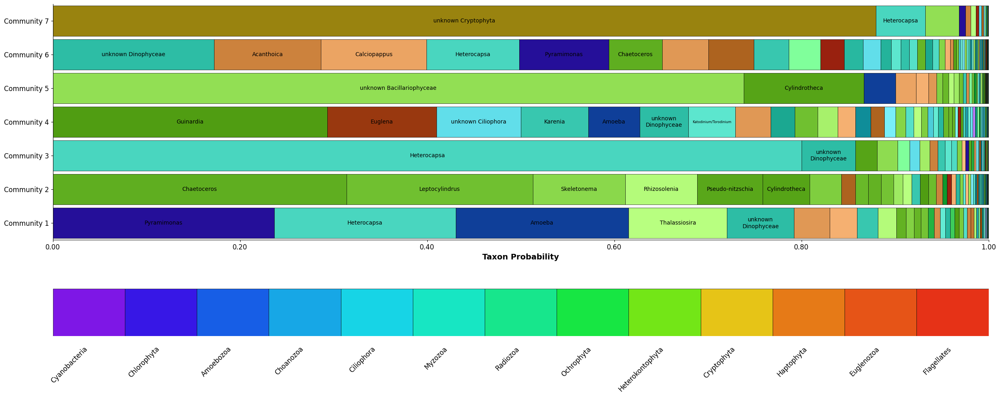

community_1
Pyramimonas                  0.236541
Heterocapsa                  0.193960
Amoeba                       0.184683
Thalassiosira                0.105333
unknown Dinophyceae          0.071497
unknown Coccolithophyceae    0.038203
Syracosphaera                0.029245
Karenia                      0.022252
Rhizosolenia                 0.019893
Corethron                    0.009968
Name: community_1, dtype: float64

community_2
Chaetoceros         0.313710
Leptocylindrus      0.199293
Skeletonema         0.098532
Rhizosolenia        0.077154
Pseudo-nitzschia    0.069878
Cylindrotheca       0.050311
Dactyliosolen       0.033750
Chrysochromulina    0.015228
Cerataulina         0.013705
Corethron           0.013655
Name: community_2, dtype: float64

community_3
Heterocapsa              0.800377
unknown Dinophyceae      0.057422
Cylindrotheca            0.022883
Nanoneis                 0.021992
Apedinella               0.012977
unknown Ciliophora       0.010851
Hemiaulus           

In [14]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors
import numpy as np

# -----------------------------
# Prepare result matrix
# -----------------------------
result = wt_matrix_df_norm.copy()
result['community'] = result.index  # Retain community identifiers
result.set_index('community', inplace=True)
result = result[sorted(result.columns)]  # Alphabetically sort taxa

topics = [f'Community_{i}' for i in range(1, rost.K + 1)]

# -----------------------------
# Generate Taxon Colors by Phylum
# -----------------------------
base_cmap = plt.get_cmap('rainbow')
phylum_order = [
    'Cyanobacteria', 'Chlorophyta', 'Amoebozoa', 'Choanozoa',
    'Ciliophora', 'Myzozoa', 'Radiozoa', 'Ochrophyta', 'Heterokontophyta',
    'Cryptophyta', 'Haptophyta', 'Euglenozoa', 'Flagellates'
]

phylum_colors = {}
taxon_colors = {}
num_phyla = len(phylum_order)

for i, phylum in enumerate(phylum_order):
    base_rgb = base_cmap(i / num_phyla)[:3]
    hsv = mcolors.rgb_to_hsv(base_rgb)

    # Deep base color
    hsv[1] = 0.9  # saturation
    hsv[2] = 0.9  # brightness
    deep_rgb = mcolors.hsv_to_rgb(hsv)
    phylum_colors[phylum] = tuple(deep_rgb) + (1.0,)

    labels = taxonomy[taxonomy['Phylum'] == phylum]['Label'].unique()
    for j, label in enumerate(labels):
        n = max(1, len(labels) - 1)
        frac = j / n
        s = 0.9 - 0.4 * frac
        v = 0.6 + 0.4 * frac
        lighter_rgb = mcolors.hsv_to_rgb([hsv[0], s, v])
        taxon_colors[label] = tuple(lighter_rgb) + (1.0,)

# -----------------------------
# Text Auto-fit Utility
# -----------------------------
def auto_fit_text(text, max_width, max_height, ax):
    text.set_text(text.get_text().replace("_", " "))
    fontsize = text.get_fontsize()
    renderer = ax.figure.canvas.get_renderer()

    while True:
        bbox = text.get_window_extent(renderer=renderer)
        if bbox.width <= max_width and bbox.height <= max_height:
            break

        # Try wrapping
        if " " in text.get_text():
            words = text.get_text().split()
            mid = len(words) // 2
            wrapped_text = "\n".join([" ".join(words[:mid]), " ".join(words[mid:])])
            text.set_text(wrapped_text)
            break

        fontsize -= 1
        if fontsize < 5:
            break
        text.set_fontsize(fontsize)

# -----------------------------
# Bar Chart Function
# -----------------------------

from matplotlib.patches import Rectangle
import numpy as np

def make_stacked_barchart(ax, result_df, taxon_colors, sort_by="phylum_taxon"):
    """
    Draw a horizontal stacked bar chart per community/topic.

    Parameters:
        ax (matplotlib.axes.Axes): Axis to draw on.
        result_df (pd.DataFrame): Taxon probabilities per topic (taxa as index, topics as columns).
        taxon_colors (dict): Mapping of taxon names to RGBA colors.
        sort_by (str): Sorting mode:
            - 'phylum_taxon': group by phylum, sort taxa alphabetically
            - 'phylum_abundance': group by phylum, sort taxa by descending abundance
            - 'taxon_abundance': ignore phylum, sort all taxa by descending abundance
    """
    k = len(result_df.columns)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.5, k + 0.5])
    ax.set_xticks(np.linspace(0, 1, 6))
    ax.set_yticks(range(1, k + 1))
    ax.set_yticklabels(result_df.columns, fontsize=12)

    taxon_to_phylum = taxonomy.set_index('Label')['Phylum'].to_dict()
    phylum_order_map = {
        ph: i for i, ph in enumerate([
            'Cyanobacteria', 'Chlorophyta', 'Amoebozoa', 'Choanozoa',
            'Ciliophora', 'Myzozoa', 'Radiozoa', 'Ochrophyta', 'Heterokontophyta',
            'Cryptophyta', 'Haptophyta', 'Euglenozoa', 'Flagellates'
        ])
    }

    bar_height = 0.9

    for i, topic in enumerate(reversed(result_df.columns)):
        y = k - i - 0.45
        x = 0.0
        topic_series = result_df[topic]
        valid_taxa = [t for t in topic_series.index if t in taxon_to_phylum]

        # --- Sorting logic ---
        if sort_by == "phylum_taxon":
            sorted_taxa = sorted(
                valid_taxa,
                key=lambda t: (
                    phylum_order_map.get(taxon_to_phylum.get(t), float('inf')),
                    t
                )
            )
        elif sort_by == "phylum_abundance":
            sorted_taxa = sorted(
                valid_taxa,
                key=lambda t: (
                    phylum_order_map.get(taxon_to_phylum.get(t), float('inf')),
                    -topic_series[t]
                )
            )
        elif sort_by == "taxon_abundance":
            sorted_taxa = topic_series[valid_taxa].sort_values(ascending=False).index.tolist()
        else:
            raise ValueError("Invalid sort_by option. Use 'phylum_taxon', 'phylum_abundance', or 'taxon_abundance'.")

        # --- Draw bars ---
        for taxon in sorted_taxa:
            prob = topic_series[taxon]
            if prob == 0:
                continue

            color = taxon_colors.get(taxon, "gray")
            rect = Rectangle((x, y), prob, bar_height, facecolor=color,
                             edgecolor='black', linewidth=0.5)
            ax.add_patch(rect)

            if prob >= 0.05:
                text = ax.text(x + prob / 2, y + bar_height / 2, taxon,
                               ha="center", va="center", fontsize=10)
                auto_fit_text(text, prob * ax.get_window_extent().width, bar_height * 20, ax)

            x += prob



# -----------------------------
# Plotting
# -----------------------------
fig, (ax_main, ax_legend) = plt.subplots(
    nrows=2, figsize=(25, 10),
    gridspec_kw={"height_ratios": [5, 1]}
)

make_stacked_barchart(ax_main, result.transpose(), taxon_colors, sort_by='taxon_abundance')

ax_main.set_xlabel("Taxon Probability", fontsize=14, fontweight='bold')
ax_main.set_xticklabels([f"{x:.2f}" for x in ax_main.get_xticks()], fontsize=12)
ax_main.set_yticklabels([t.replace('_', ' ') for t in topics], fontsize=12)
ax_main.spines['top'].set_visible(False)
ax_main.spines['right'].set_visible(False)

# Phylum color legend
for i, (phylum, color) in enumerate(phylum_colors.items()):
    ax_legend.add_patch(Rectangle((i, 0), 1, 1, facecolor=color, edgecolor='black', linewidth=0.5))
    ax_legend.text(i + 0.5, -0.2, phylum, ha='right', va='top', rotation=45, fontsize=12)

ax_legend.set_xlim(0, len(phylum_colors))
ax_legend.set_ylim(0, 1)
ax_legend.axis('off')

plt.tight_layout(h_pad=5)
plt.show()

# -----------------------------
# Top Taxa by Community Summary
# -----------------------------
top_taxa_by_comm = {
    comm: result.transpose()[comm].sort_values(ascending=False).head(10)
    for comm in result.transpose().columns
}

for community, top_taxa in top_taxa_by_comm.items():
    print(f"{community}\n{top_taxa}\n")


/tmp/ipykernel_25439/634553556.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20c', n_topics)


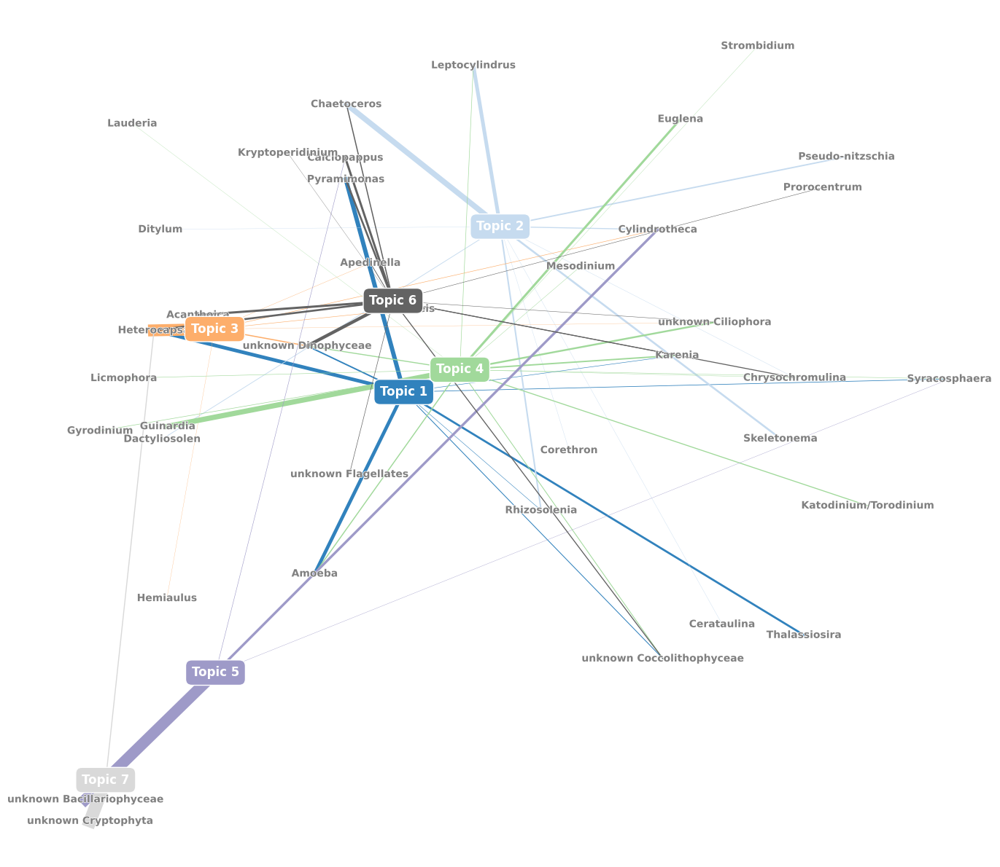

In [15]:
import matplotlib.pyplot as plt
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
from matplotlib.patches import Patch
import matplotlib.cm as cm
from matplotlib import patheffects

def project_word_topic_network_nmds(phi, feature_names, obs_matrix_df,
                                    score_threshold=0.01, taxon_color=None,
                                    metric='braycurtis', hide_low_score_words=False, linescale=5):
    """
    Visualize word-topic network using NMDS from observation data.

    Parameters:
        phi : np.ndarray (n_topics x n_words) - topic-word matrix
        feature_names : list or np.ndarray - vocabulary terms
        obs_matrix_df : pd.DataFrame (words x samples) - observation matrix
        score_threshold : float - minimum topic-word score to draw edge
        taxon_color : dict - mapping from word to color
        metric : str - dissimilarity metric for NMDS (e.g., 'braycurtis')
        hide_low_score_words : bool - if True, don't plot words below threshold for all topics
    """
    
    n_topics, n_words = phi.shape

    # === Step 1: NMDS on observation matrix ===
    obs_matrix = obs_matrix_df.to_numpy()  # (n_words x n_samples)
    dissimilarity = pairwise_distances(obs_matrix, metric=metric)
    nmds = MDS(n_components=2, dissimilarity='precomputed', metric=False, random_state=42)
    coords = nmds.fit_transform(dissimilarity)

    # === Step 2: Topic centroids ===
    topic_coords = []
    for topic_idx in range(n_topics):
        weights = phi[topic_idx]
        weights = weights / weights.sum()
        x = np.sum(coords[:, 0] * weights)
        y = np.sum(coords[:, 1] * weights)
        topic_coords.append((x, y))
    topic_coords = np.array(topic_coords)

    # === Step 3: Build plot ===
    fig, ax = plt.subplots(figsize=(14, 12))
    colors = cm.get_cmap('tab20c', n_topics)

    # Track which words are used (for conditional display)
    word_used = np.zeros(n_words, dtype=bool)

    # Draw topic → word edges
    for topic_idx in range(n_topics):
        color = colors(topic_idx)
        x_topic, y_topic = topic_coords[topic_idx]
        for word_idx in range(n_words):
            score = phi[topic_idx, word_idx]
            if score >= score_threshold:
                x_word, y_word = coords[word_idx]
                line_width = np.log1p(score) * linescale
                ax.plot([x_topic, x_word], [y_topic, y_word],
                        color=color, alpha=1, linewidth=line_width, zorder=1)
                word_used[word_idx] = True

    # === Step 4: Plot word labels ===
    for idx in range(n_words):
        if hide_low_score_words and not word_used[idx]:
            continue
        word = feature_names[idx]
        x, y = coords[idx]
        node_color = taxon_color.get(word, 'black') if taxon_color else 'gray'
        text = ax.text(x, y, word,
                       fontsize=10, color=node_color, weight='bold', zorder=2,ha='center', va='center')
        text.set_path_effects([
            patheffects.withStroke(linewidth=1, foreground='white')
        ])

    # === Step 5: Plot topic nodes ===
    for i, (x, y) in enumerate(topic_coords):
        ax.text(x, y, f'Topic {i+1}', fontsize=12, weight='bold',
                ha='center', va='center', color='white', zorder=3,
                bbox=dict(boxstyle='round,pad=0.5',
                          facecolor=colors(i), edgecolor='white', linewidth=1))

    # Decorations
    ax.axis('off')
    plt.tight_layout()
    plt.show()


phi = wt_matrix_df_norm.to_numpy()
feature_names = wt_matrix_df_norm.columns.to_numpy()
obs_matrix = dataset.T  # shape: (words x samples)

project_word_topic_network_nmds(
    phi=phi,
    feature_names=feature_names,
    obs_matrix_df=obs_matrix,
    taxon_color=None,
    score_threshold=0.01,
    linescale=20,  # Adjust line width scaling
    metric='euclidean',  # or 'euclidean'
    hide_low_score_words=True  # Hide words with low scores across all topics
)


/tmp/ipykernel_25439/634129611.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = plt.cm.get_cmap('tab20c', len(unique_clusters))


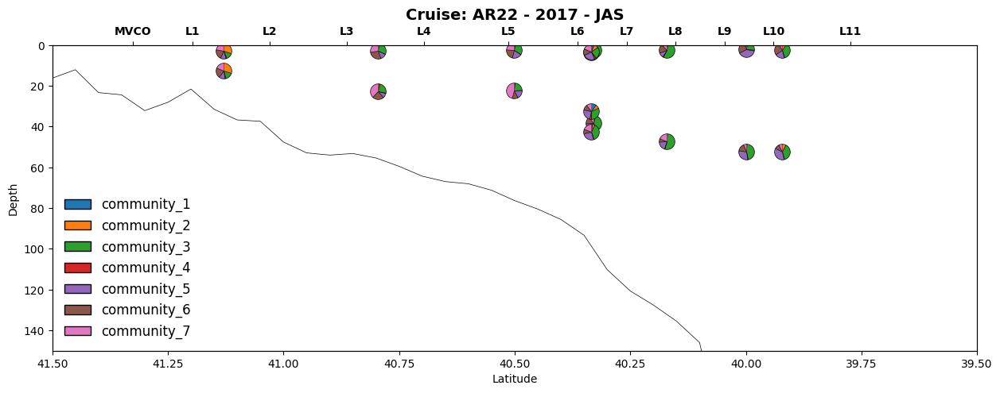

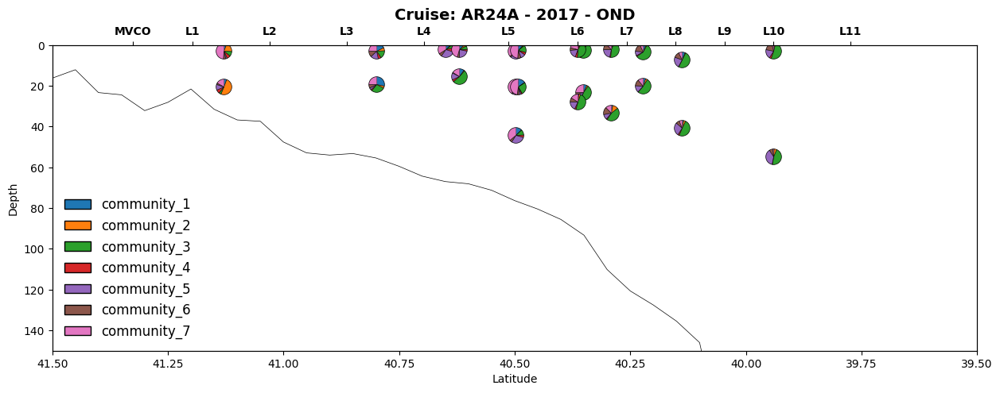

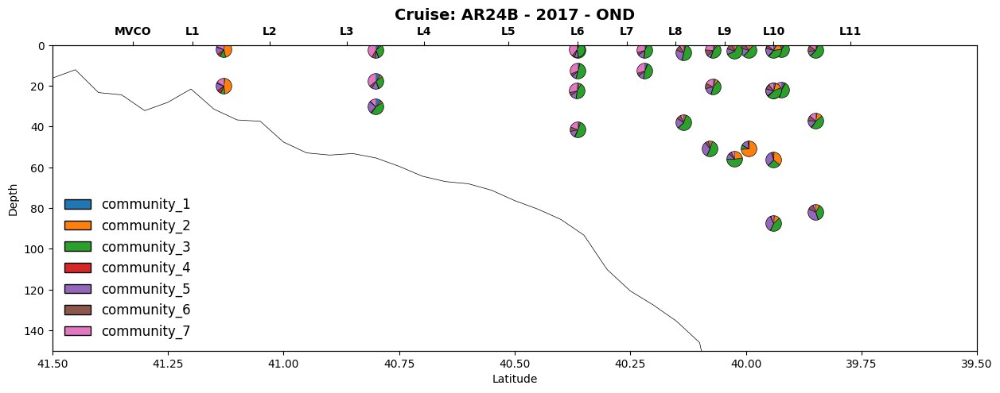

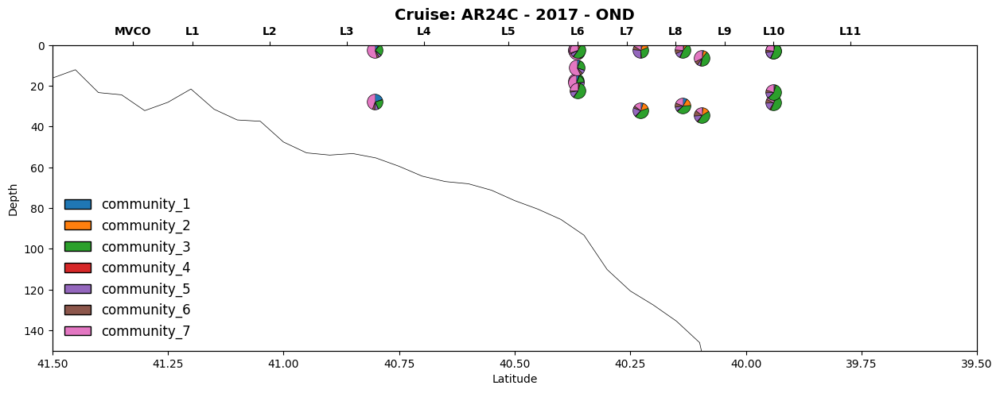

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Patch
from matplotlib.cm import rainbow

df = metadata
data = topic_df.reset_index()
data_merged = pd.merge(df, data, on='pid', how='left')
data_merged.sort_values('sample_time', inplace=True)

stations = pd.read_csv('NESLTER_station_list.csv')
bathy = pd.read_csv('NESLTER_transect_bathymetry.csv')
clusters = clusters

topics = [f'community_{i+1}' for i in range(rost.K)]
proportions_sum_max = data_merged[topics].sum(axis=1).max()
unique_clusters = np.unique(clusters)
colormap = plt.cm.get_cmap('tab20c', len(unique_clusters))
cluster_colors_dict = {i: colormap(idx / (len(unique_clusters) - 1)) for idx, i in enumerate(unique_clusters)}

for cruise in data_merged['cruise'].unique()[:4]:
    ds = data_merged[data_merged['cruise'] == cruise]
    fig, ax = plt.subplots(figsize=(15, 5))
    # cluster = clusters[clusters['cruise'] == cruise]
    # ax.scatter(cluster['latitude'], cluster['depth'], s=500, c=cluster['clusters'].map(cluster_colors_dict))

    for _, row in ds.iterrows():
        lat, depth = row['latitude'], row['depth']
        proportions = np.array([row[topic] for topic in topics])

        if np.isnan(proportions).any():  # Skip points with missing values
            continue
        
        size_factor = proportions.sum() / proportions_sum_max
        proportions = proportions.astype(float) / proportions.sum()  # Normalize to sum=1
        start_angle = np.pi / 2  # Set 12 o’clock (90°) as the starting point

        angles = np.insert(np.cumsum(proportions) * 2 * np.pi, 0, 0)  # Compute cumulative angles
        angles = start_angle - angles  # Rotate so first segment starts at 12 o'clock

        markers = []
        sizes = []
        for i in range(len(proportions)):
            x = [0] + np.cos(np.linspace(angles[i], angles[i + 1], 100)).tolist()
            y = [0] + np.sin(np.linspace(angles[i], angles[i + 1], 100)).tolist()
            xy = np.column_stack([x, y])
            s = np.abs(xy).max()

            markers.append(xy)
            sizes.append(s ** 2 * 200)  # Adjust marker size

        #sizes = np.array(sizes) * size_factor *10 # Adjust marker size with respect to total count
        # Plot each segment as a separate scatter point to build the pie
        for i in range(len(proportions)):
            ax.scatter(lat, depth, marker=markers[i], s=sizes[i], facecolor=colors[i], edgecolors='black', linewidth=0.5)

    # Labels & Axes Formatting
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Depth')
    ax.set_xlim(41.5, 39.5)  # Latitude inverted
    ax.set_ylim(150, 0)  # Depth inverted

    # Top axis with station labels
    ax_top = ax.twiny()
    ax_top.set_xlim(ax.get_xlim())
    ax_top.set_xticks(stations['latitude'])
    ax_top.set_xticklabels(stations['station'].astype(str), weight='bold', size=10)

    ax.plot(
        bathy['latitude'], bathy['bottom_depth_meters'], 'k-', label='Bathymetry', linewidth=0.5
    )
    YEAR = int(ds['year'].unique()[0])  # Ensure int conversion
    SEASON = ds['season'].unique()[0]
    ax.set_title(f'Cruise: {cruise} - {YEAR} - {SEASON}', weight='bold', size=14)
    ax.legend(handles=[Patch(facecolor=color, edgecolor='black', label=topic) for color, topic in zip(colors, topics)], loc="lower left", fontsize=12, frameon=False, ncol=1)

    plt.show()


In [31]:
# import matplotlib.gridspec as gridspec
# data = topic_prob_df.reset_index()
# data_merged = pd.merge(metadata, data, on='pid', how='left')
# data_merged.sort_values('sample_time', inplace=True)

# stations = pd.read_csv('NESLTER_station_list.csv')
# bathy = pd.read_csv('NESLTER_transect_bathymetry.csv')
# data_merged['year_season'] = (
#     data_merged['year'].fillna(0).astype(int).astype(str) + '_' + data_merged['season'].astype(str)
# )

# communities = [f'community_{i+1}' for i in range(rost.K)]
# cruises = data_merged['year_season'].unique()
# for community in communities:
#     total_plots = len(cruises) + 1  # +1 for the bar plot
#     ncols = int(np.ceil(np.sqrt(total_plots)))
#     nrows = int(np.ceil(total_plots / ncols))

#     fig = plt.figure(figsize=(8 * ncols, 4 * nrows))
#     gs = gridspec.GridSpec(nrows, ncols, figure=fig)
#     axes = []

#     # Create scatter plots
#     for i, cruise in enumerate(cruises):
#         row, col = divmod(i, ncols)
#         sharex_ax = axes[0] if axes else None
#         ax = fig.add_subplot(gs[row, col], sharex=sharex_ax, sharey=sharex_ax)
#         axes.append(ax)

#         cruise_data = data_merged[data_merged['year_season'] == cruise]
#         scatter = ax.scatter(
#             cruise_data['latitude'],
#             cruise_data['depth'],
#             c=cruise_data[community],
#             s=100,
#             edgecolor='k',
#             alpha=1,
#             vmin=0,
#             vmax=1,
#             cmap='Reds'
#         )
#         ax.plot(bathy['latitude'], bathy['bottom_depth_meters'], 'k-', linewidth=0.5)
#         ax.set_title(cruise, fontsize=12)
#         ax.set_xlim(41.5, 39.5)
#         ax.set_ylim(150, 0)
#         ax.tick_params(axis='both', which='major', labelsize=12)

#         if i % ncols == 0:
#             ax.set_ylabel('Depth')
#         if i >= ncols * (nrows - 1):
#             ax.set_xlabel('Latitude')

#     # Add bar plot as the final subplot, no sharing
#     if community in top_taxa_by_comm:
#         row, col = divmod(len(cruises), ncols)
#         ax_bar = fig.add_subplot(gs[row, col])
#         axes.append(ax_bar)

#         bar_data = top_taxa_by_comm[community]  # LOWEST at bottom, HIGHEST at top
#         ax_bar.barh(bar_data.index, bar_data.values, color='gray')

#         # Move y-tick labels to the left (inside the plot)
#         ax_bar.tick_params(axis='y', labelright=False, labelleft=True, left=False)

#         # Tighten space between labels and bars
#         ax_bar.set_yticks(np.arange(len(bar_data.index)))
#         # ax_bar.set_yticklabels(bar_data.index, ha='right')
#         # Hide y-axis ticks and labels
#         ax_bar.tick_params(axis='y', left=False, labelleft=False)
#         # Draw labels as text next to the bars
#         for i, (taxon, value) in enumerate(bar_data.items()):
#             ax_bar.text(
#                 value + 0.01,  # slightly to the right of the bar
#                 i,
#                 taxon,
#                 va='center',
#                 ha='left',
#                 fontsize=12
#             )
            
#         ax_bar.invert_yaxis()  # Highest on top
#         ax_bar.set_title(f"Top abundant taxa", fontsize=12)
#         ax_bar.set_xlabel("Relative Abundance", fontsize=12)
#         ax_bar.set_xlim(0, 1)
#     else:
#         row, col = divmod(len(cruises), ncols)
#         fig.add_subplot(gs[row, col]).axis('off')


#     # Hide any extra unused slots
#     for i in range(len(cruises) + 1, nrows * ncols):
#         fig.add_subplot(gs[i // ncols, i % ncols]).axis('off')

#     # Shared colorbar
#     cbar_ax = fig.add_axes([0.3, 0.05, 0.4, 0.02])
#     cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
#     cbar.set_label(f'{community.replace("_", " ").title()} Probability', fontsize=12)

#     # Add station labels to top row of scatter plots
#     for k, ax in enumerate(axes[:ncols]):
#         ax_top = ax.twiny()
#         ax_top.set_xlim(ax.get_xlim())
#         ax_top.set_xticks(stations['latitude'])
#         ax_top.set_xticklabels(stations['station'].astype(str), weight='bold', size=12)

#     fig.tight_layout(rect=[0, 0.08, 1, 1], w_pad=2, h_pad=3)
#     plt.show()


/tmp/ipykernel_25439/2459795777.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.05, 0.08, 0.78, 0.97], w_pad=2, h_pad=2)


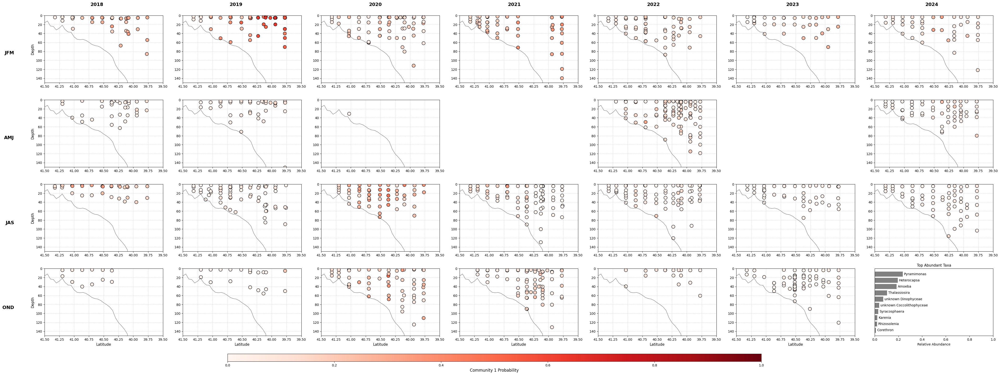

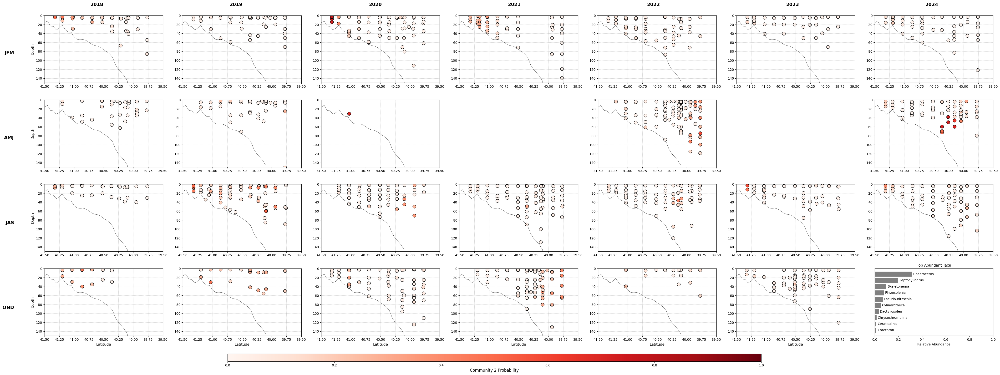

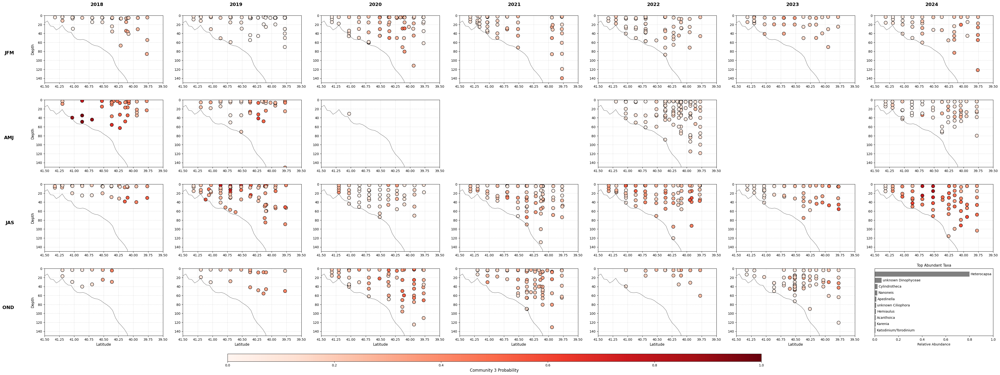

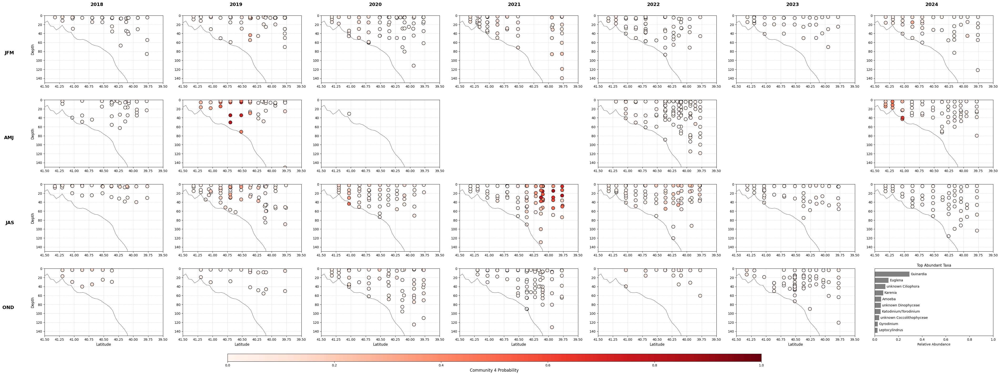

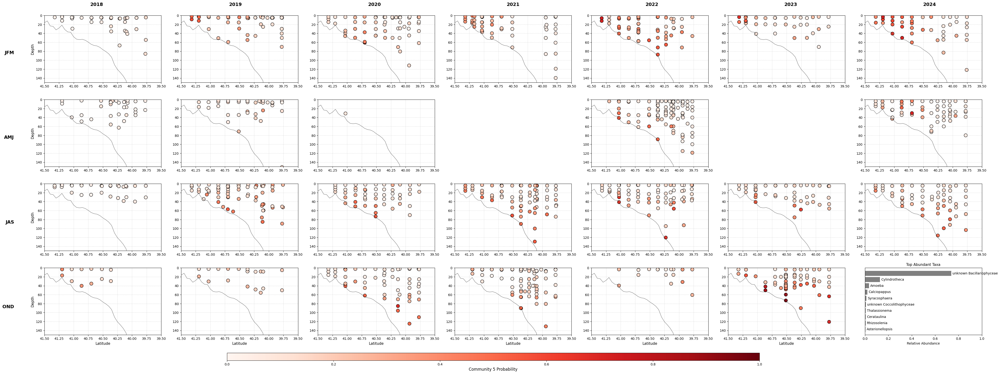

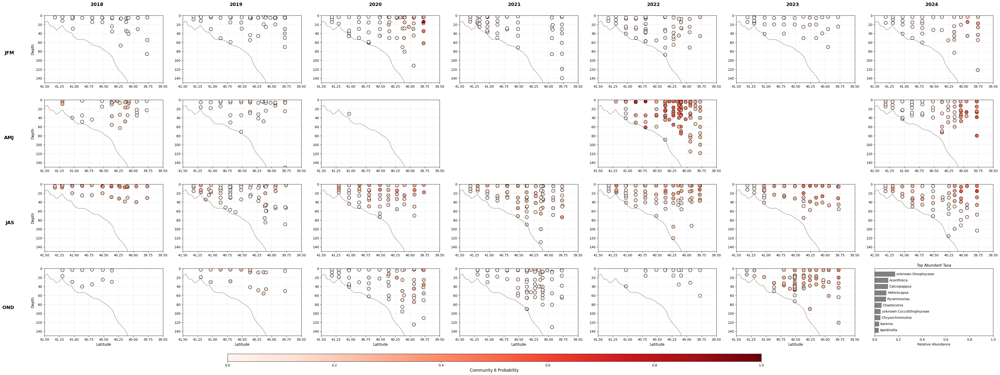

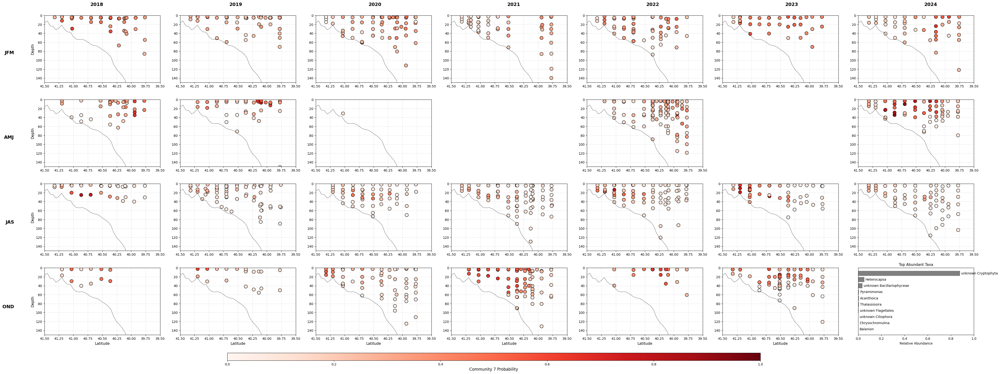

In [20]:
import matplotlib.gridspec as gridspec
data = topic_prob_df.reset_index()
data_merged = pd.merge(metadata, data, on='pid', how='left')
data_merged.sort_values('sample_time', inplace=True)

stations = pd.read_csv('NESLTER_station_list.csv')
bathy = pd.read_csv('NESLTER_transect_bathymetry.csv')
data_merged['year_season'] = (
    data_merged['year'].fillna(0).astype(int).astype(str) + '_' + data_merged['season'].astype(str)
)

communities = [f'community_{i+1}' for i in range(rost.K)]
cruises = data_merged['year_season'].unique()
# Extract years and seasons from year_season
data_merged['year'] = data_merged['year_season'].str[:4]
data_merged['season'] = data_merged['year_season'].str[5:]

years = ['2018', '2019', '2020', '2021', '2022', '2023', '2024'] #sorted(data_merged['year'].unique())
seasons = ['JFM', 'AMJ', 'JAS', 'OND']  # fixed order
# Swap roles: seasons = rows, years = columns
nrows = len(seasons)
ncols = len(years)

for community in communities:
    fig = plt.figure(figsize=(8 * ncols, 4 * nrows))
    gs = gridspec.GridSpec(nrows, ncols, figure=fig)
    axes = {}

    for i, season in enumerate(seasons):  # rows
        for j, year in enumerate(years):  # columns
            cruise = f"{year}_{season}"
            if i == 0 and j == 0:
                ax = fig.add_subplot(gs[i, j])
                ref_ax = ax
            else:
                ax = fig.add_subplot(gs[i, j], sharex=ref_ax, sharey=ref_ax)

            axes[(season, year)] = ax

            if cruise in data_merged['year_season'].values:
                cruise_data = data_merged[data_merged['year_season'] == cruise]
                scatter = ax.scatter(
                    cruise_data['latitude'],
                    cruise_data['depth'],
                    c=cruise_data[community],
                    s=100,
                    edgecolor='k',
                    alpha=1,
                    vmin=0,
                    vmax=1,
                    cmap='Reds'
                )
                ax.plot(bathy['latitude'], bathy['bottom_depth_meters'], 'k-', linewidth=0.5)
                ax.set_xlim(41.5, 39.5)
                ax.set_ylim(150, 0)
                ax.tick_params(axis='both', which='major', labelsize=10)
            else:
                ax.axis('off')

            if j == 0:
                ax.set_ylabel('Depth', fontsize=11)
            if i == nrows - 1:
                ax.set_xlabel('Latitude', fontsize=11)

            ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    # === Label margins from layout
    left, bottom, right, top = 0.05, 0.08, 0.78, 0.97
    plot_width = right - left
    plot_height = top - bottom

    # === Column labels (years)
    for j, year in enumerate(years):
        x_pos = left + (j + 0.5) / ncols * plot_width
        fig.text(
            x=x_pos, y=top + 0.01,
            s=year,
            ha='center', va='bottom',
            fontsize=14, fontweight='bold'
        )

    # === Row labels (seasons)
    for i, season in enumerate(seasons):
        y_pos = top - (i + 0.5) / nrows * plot_height
        fig.text(
            x=left - 0.01, y=y_pos,
            s=season,
            ha='right', va='center',
            fontsize=14, fontweight='bold'
        )

    # Add bar plot in last grid cell (bottom-right corner)
    if community in top_taxa_by_comm:
        ax_bar = fig.add_subplot(gs[nrows - 1, ncols - 1])
        bar_data = top_taxa_by_comm[community]
        ax_bar.barh(bar_data.index, bar_data.values, color='gray')
        ax_bar.invert_yaxis()
        for k, (taxon, value) in enumerate(bar_data.items()):
            ax_bar.text(value + 0.01, k, taxon, va='center', fontsize=10)
        ax_bar.set_xlim(0, 1)
        ax_bar.set_title('Top Abundant Taxa', fontsize=11)
        ax_bar.set_xlabel('Relative Abundance', fontsize=10)
        ax_bar.tick_params(axis='y', left=False, labelleft=False)

    # Shared colorbar
    cbar_ax = fig.add_axes([0.2, 0.05, 0.4, 0.02])
    cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
    cbar.set_label(f'{community.replace("_", " ").title()} Probability', fontsize=12)

    fig.tight_layout(rect=[0.05, 0.08, 0.78, 0.97], w_pad=2, h_pad=2)
    plt.show()

